## ICE-6 Color features and histogram
Please download the following images for the ICE-6:<br>
https://drive.google.com/file/d/136KacYJQZ3ShMSDndqgzohTlTPrfKuma/view?usp=sharing

# GitHub Link:
#### https://github.com/nehabaddam/Feature_Engineering

In [4]:
from google.colab import drive


## (Tutorial) Dominant colors
Please refer to the following link to learn how to extract dominant colors of a given image:<br>
https://www.dataquest.io/blog/tutorial-colors-image-clustering-python/

## Example 1. Extracting dominant colors

In [6]:
pip install utils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
# import the necessary packages

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import argparse
import utils
import cv2

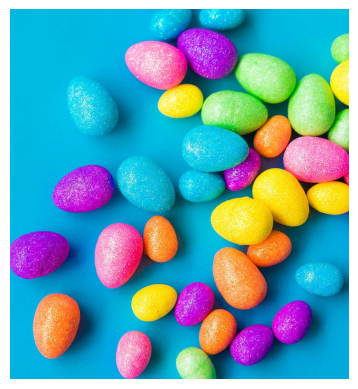

In [9]:
# load the image and convert it from BGR to RGB so that
# we can dispaly it with matplotlib
image = cv2.imread("eggs.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure()
plt.axis("off")
plt.imshow(image)

In [10]:
# reshape the image to proper version for the following processing
image = image.reshape((image.shape[0] * image.shape[1], 3))

In [11]:
# cluster the pixel intensities
clt = KMeans(n_clusters = 10)
clt.fit(image)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=10)

In [13]:
# import the necessary packages
import numpy as np
import cv2
def centroid_histogram(clt):
# grab the number of different clusters and create a histogram
# based on the number of pixels assigned to each cluster
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
    (hist, _) = np.histogram(clt.labels_, bins = numLabels)
# normalize the histogram, such that it sums to one
    hist = hist.astype("float")
    hist /= hist.sum()
# return the histogram
    return hist

In [14]:
def plot_colors(hist, centroids):
# initialize the bar chart representing the relative frequency
# of each of the colors
    bar = np.zeros((50, 300, 3), dtype = "uint8")
    startX = 0
# loop over the percentage of each cluster and the color of
# each cluster
    for (percent, color) in zip(hist, centroids):
# plot the relative percentage of each cluster
        endX = startX + (percent * 300)
        cv2.rectangle(bar, (int(startX), 0), (int(endX), 50),
            color.astype("uint8").tolist(), -1)
        startX = endX

# return the bar chart
    return bar

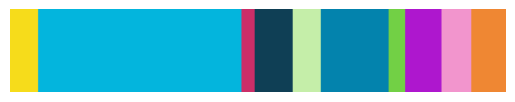

In [15]:
# build a histogram of clusters and then create a figure
# representing the number of pixels labeled to each color
hist = centroid_histogram(clt)
bar = plot_colors(hist, clt.cluster_centers_)
# show our color bart
plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

## (Tutorial) Within-Cluster Sum of Square (wcss) and Elbow method
Please refer to the following link to learn Elbow method for optimal number of clusters selecting:<br>
https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/

## Task 1. Using the Elbow method to select the optimal number of clusters for the three images in your downloaded zip file
1. Selecting the optimal number of clusters using Elbow method
2. Visualizing the histogram of clusters as shown in example 1 with the optimal number of clusters

In [16]:
# write you code here
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

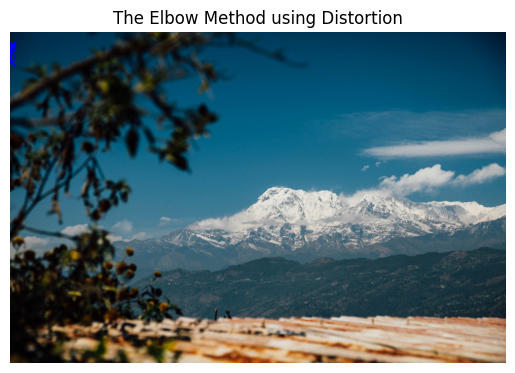

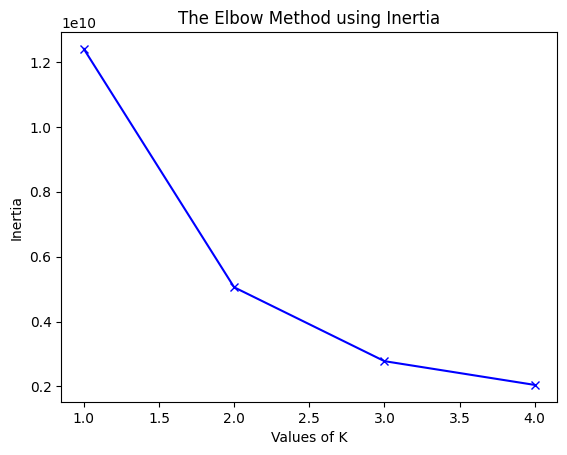

In [17]:
# Image One
image = cv2.imread("Nepal.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure()
plt.axis("off")
plt.imshow(image)
image = image.reshape((image.shape[0] * image.shape[1], 3))

distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 5)

for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(image)
    kmeanModel.fit(image)
    distortions.append(sum(np.min(cdist(image, kmeanModel.cluster_centers_,'euclidean'), axis=1)) / image.shape[0])
    inertias.append(kmeanModel.inertia_)
    mapping1[k] = sum(np.min(cdist(image, kmeanModel.cluster_centers_,'euclidean'), axis=1)) / image.shape[0]
    mapping2[k] = kmeanModel.inertia_

plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

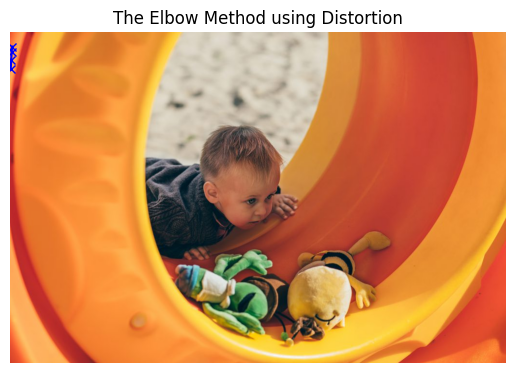

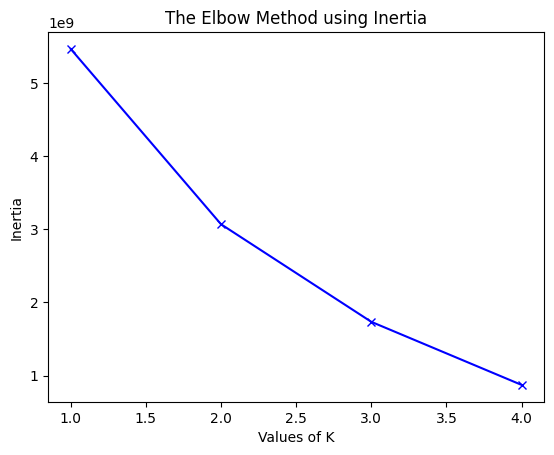

In [18]:
# Image Two
image = cv2.imread("boy.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure()
plt.axis("off")
plt.imshow(image)
image = image.reshape((image.shape[0] * image.shape[1], 3))

distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 5)

for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(image)
    kmeanModel.fit(image)
    distortions.append(sum(np.min(cdist(image, kmeanModel.cluster_centers_,'euclidean'), axis=1)) / image.shape[0])
    inertias.append(kmeanModel.inertia_)
    mapping1[k] = sum(np.min(cdist(image, kmeanModel.cluster_centers_,'euclidean'), axis=1)) / image.shape[0]
    mapping2[k] = kmeanModel.inertia_

plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

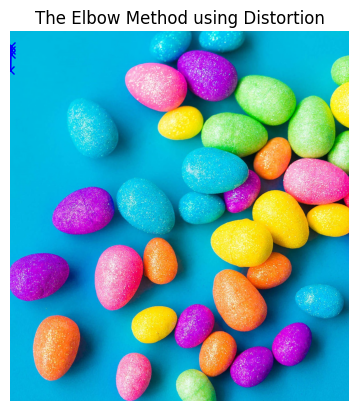

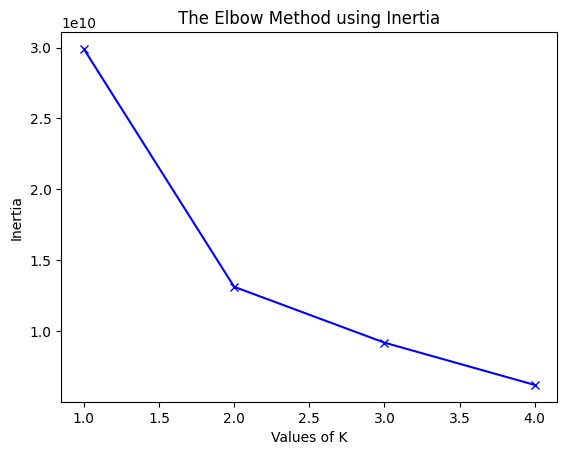

In [19]:
# Image Three
image = cv2.imread("eggs.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure()
plt.axis("off")
plt.imshow(image)
image = image.reshape((image.shape[0] * image.shape[1], 3))

distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 5)

for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(image)
    kmeanModel.fit(image)
    distortions.append(sum(np.min(cdist(image, kmeanModel.cluster_centers_,'euclidean'), axis=1)) / image.shape[0])
    inertias.append(kmeanModel.inertia_)
    mapping1[k] = sum(np.min(cdist(image, kmeanModel.cluster_centers_,'euclidean'), axis=1)) / image.shape[0]
    mapping2[k] = kmeanModel.inertia_

plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

## Question 1. According to the Elbow method, how to choose the optimal number of clusters?

**Answer to Q1**:

To choose the optimal number of clusters we need to follow few steps:

1. Firstly, we need to choose a range of values and select a cluster number from it.
2. For each value of number of cluster, K-means clustering is performed and WCSS is calculated between every data point and the cluster centroid.
3. We plot the number of clusters and WCSS on a graph.
4. Now in the graph, we must identify the decrease in WCSS, representing an elbow.
5. The optimal number of clusters is determined by a trade-off between minimising the WCSS and keeping the model simple and interpretable. Basically, the total WSS for whichever number of cluster is highest is optimal, by increasing the cluster number should does not improve the total WSS anymore.


---

## (Tutorial) Histogram Equalization
Please refer to the following link to learn the histogram equalization:<br>
https://medium.com/@kyawsawhtoon/a-tutorial-to-histogram-equalization-497600f270e2 <br> and
https://hypjudy.github.io/2017/03/19/dip-histogram-equalization/

## Example 2. Histogram equalization on gray image

Original Image


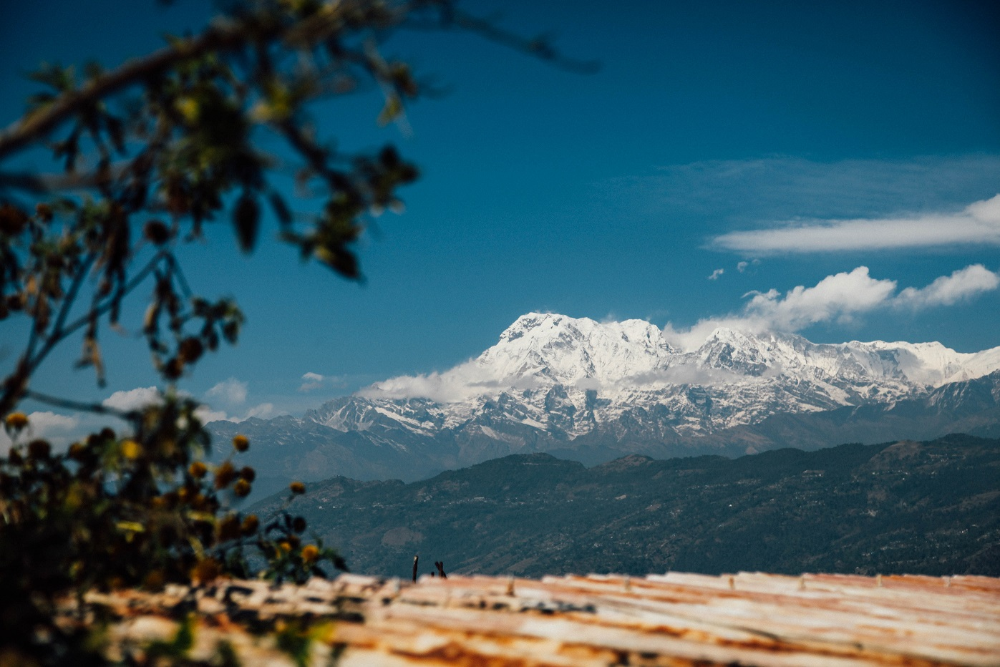

Gray Image


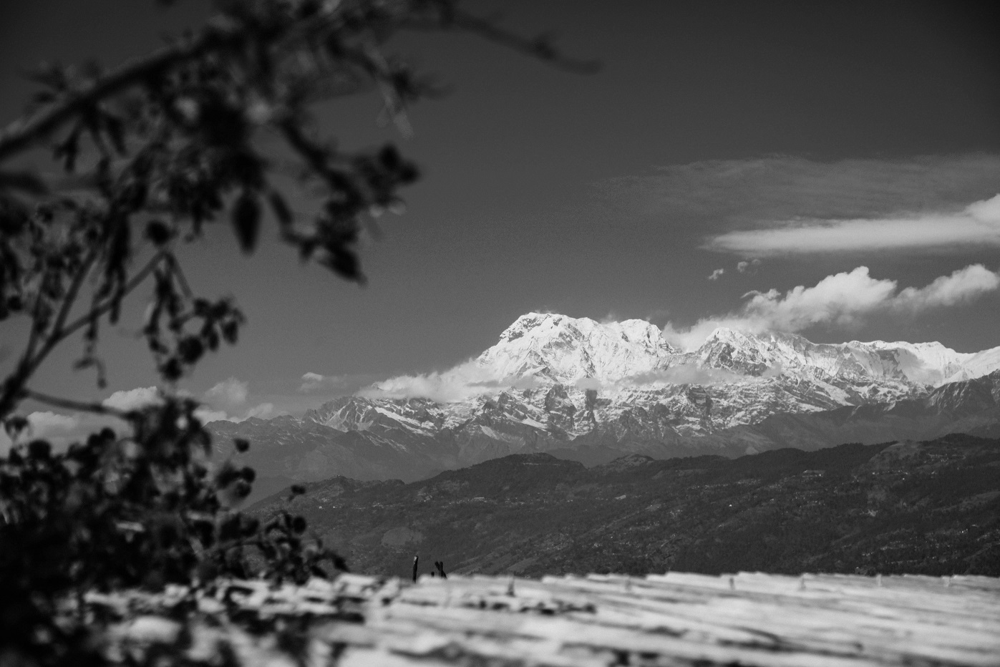

In [20]:
from google.colab.patches import cv2_imshow

img = cv2.imread('Nepal.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print("Original Image")
cv2_imshow(img)
print("Gray Image")
cv2_imshow(gray)
cv2.waitKey(0)
cv2.destroyAllWindows()

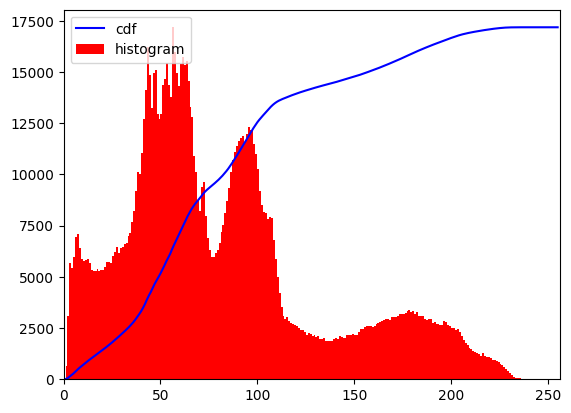

In [21]:
hist,bins = np.histogram(gray.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(gray.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

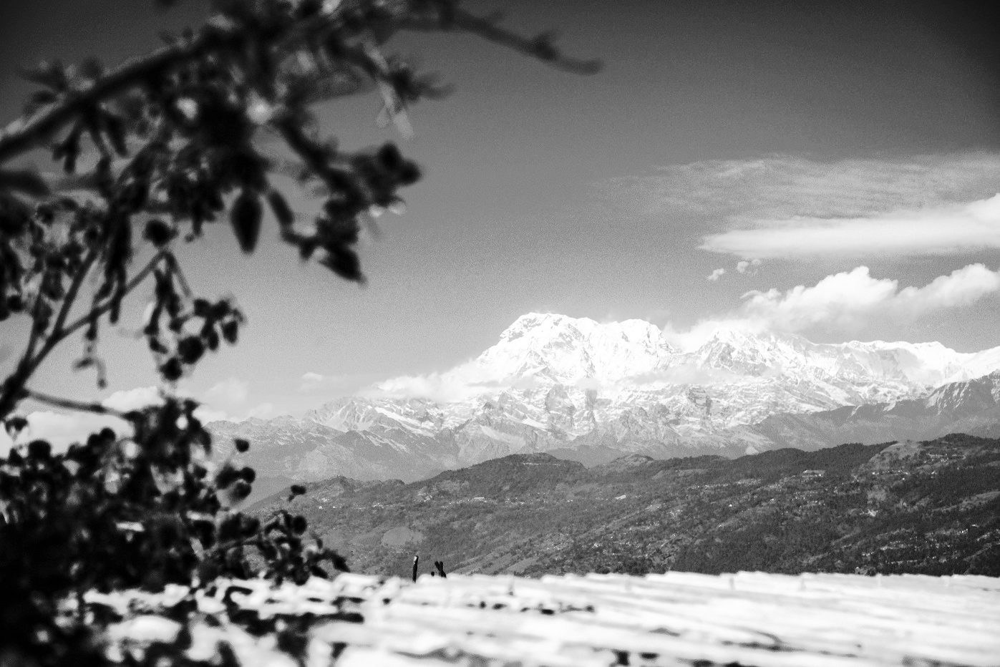

In [22]:
equ = cv2.equalizeHist(gray)
cv2_imshow(equ)
cv2.waitKey(0)
cv2.destroyAllWindows()

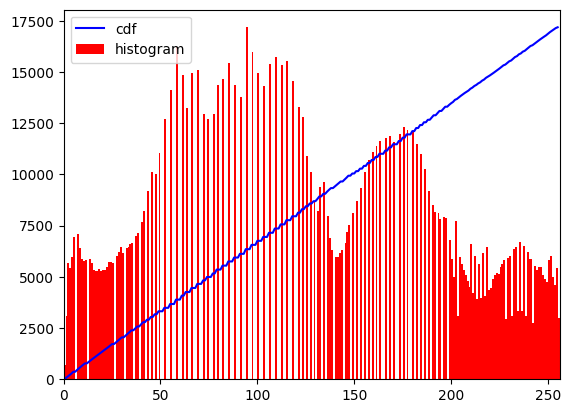

In [23]:
hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()


## Task 2. Histogram equalization on color images
1. Apply histogram equalization on the 3 downloaded images
2. Visualize the histograms and the cumulative summation before and after histogram equalization
3. Show the images before and after histogram equalization

Original Image


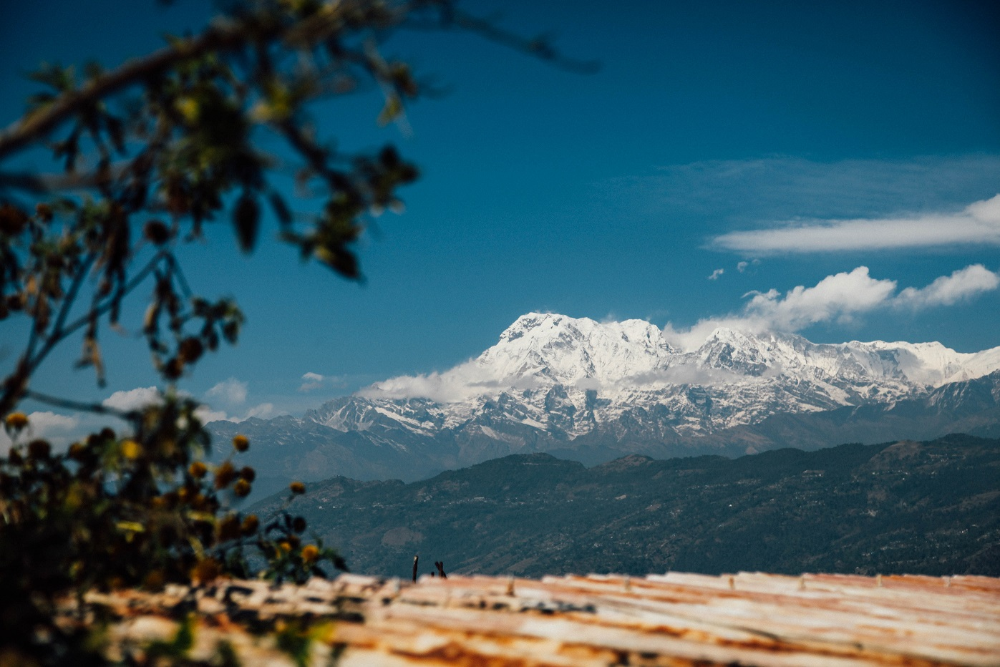

Histogram - Original Image


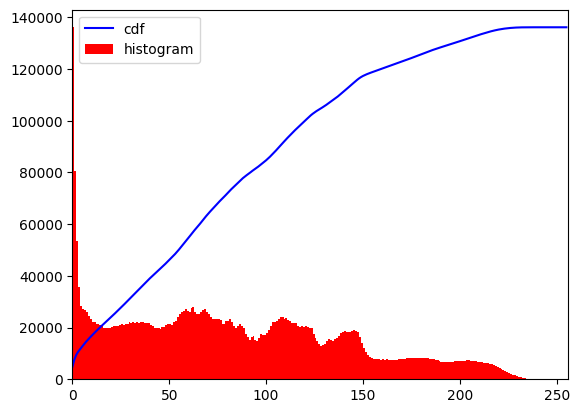

Equalized Image


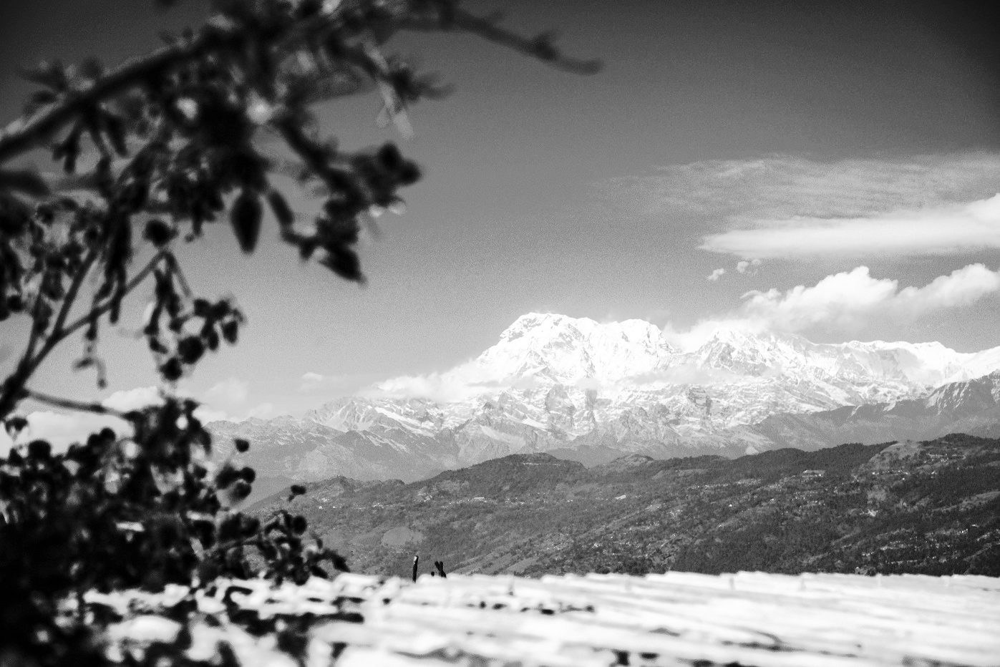

Histogram - Equalized Image


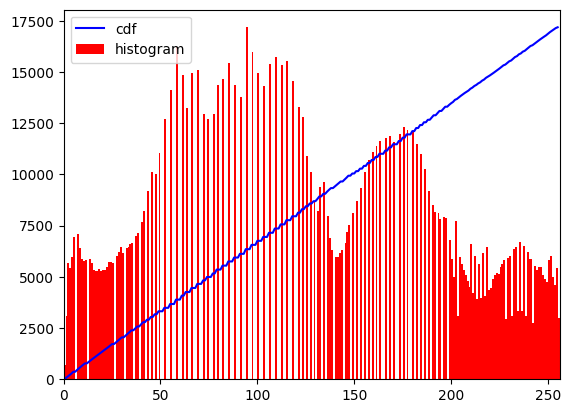

In [25]:
# write your code here
# Image One
img_one = cv2.imread('Nepal.jpg')
print("Original Image")
cv2_imshow(img_one)

hist,bins = np.histogram(img_one.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img_one.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
print("Histogram - Original Image")
plt.show()

equ = cv2.equalizeHist(cv2.cvtColor(img_one, cv2.COLOR_BGR2GRAY))
print("Equalized Image")
cv2_imshow(equ)

hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
print("Histogram - Equalized Image")
plt.show()

Original Image


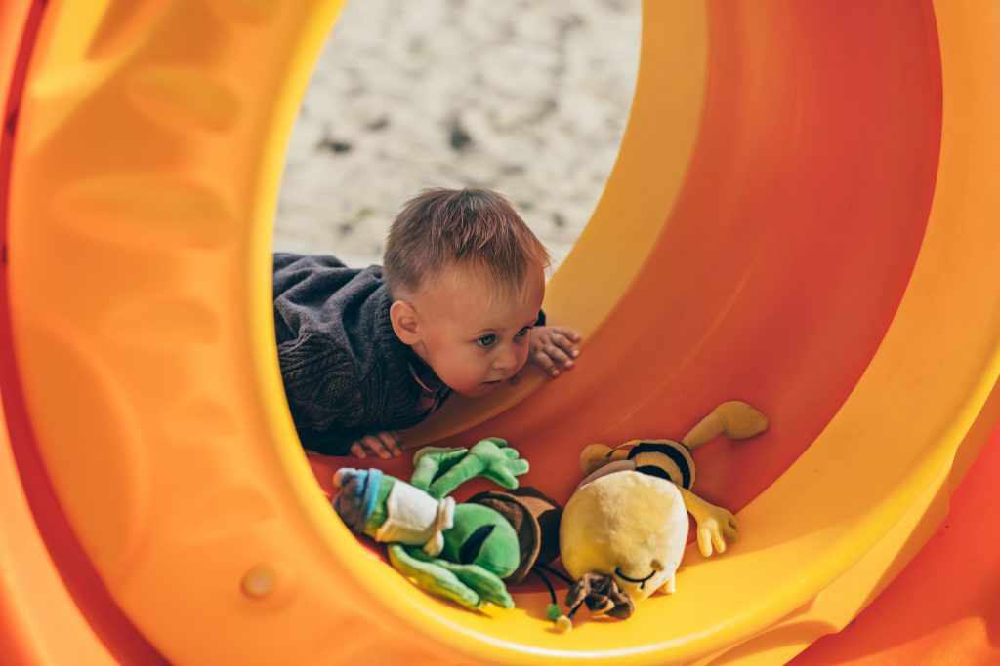

Histogram - Original Image


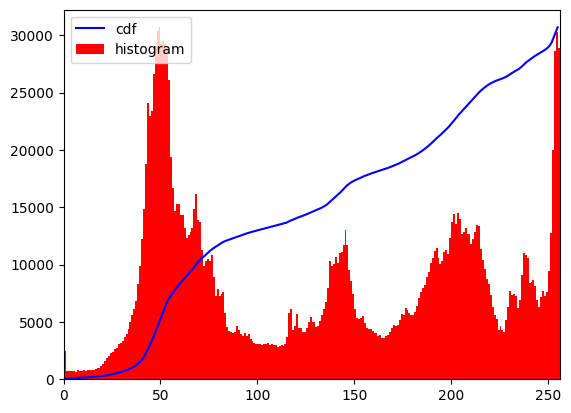

Equalized Image


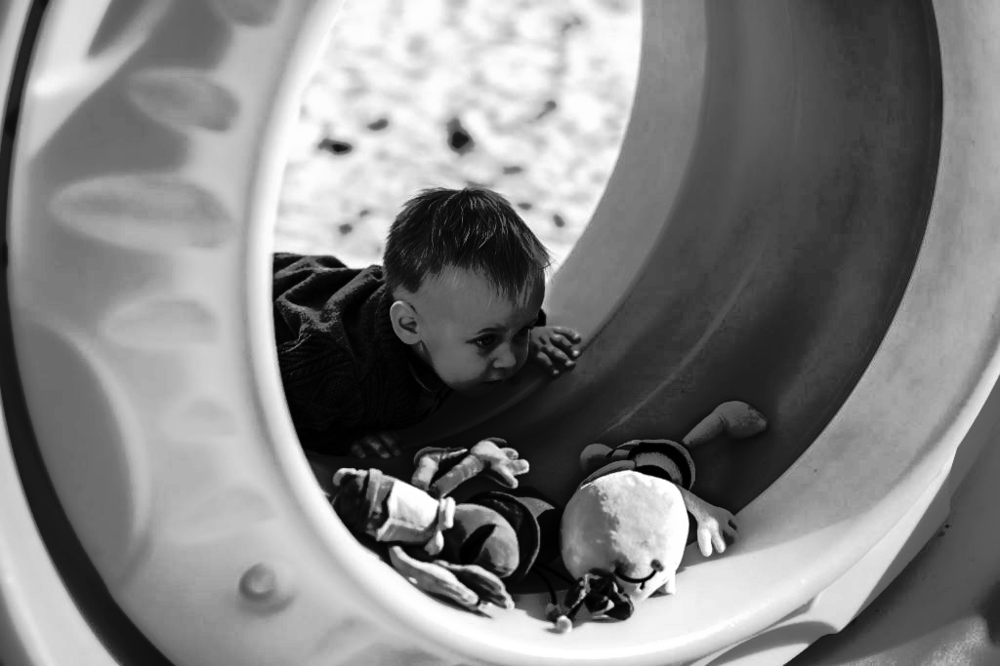

Histogram - Original Image


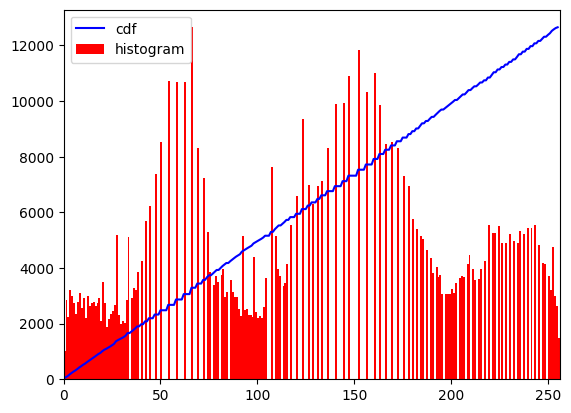

In [26]:
# write your code here
# Second One
img_one = cv2.imread('boy.jpg')
print("Original Image")
cv2_imshow(img_one)

hist,bins = np.histogram(img_one.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img_one.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
print("Histogram - Original Image")
plt.show()

equ = cv2.equalizeHist(cv2.cvtColor(img_one, cv2.COLOR_BGR2GRAY))
print("Equalized Image")
cv2_imshow(equ)

hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
print("Histogram - Original Image")
plt.show()

Original Image


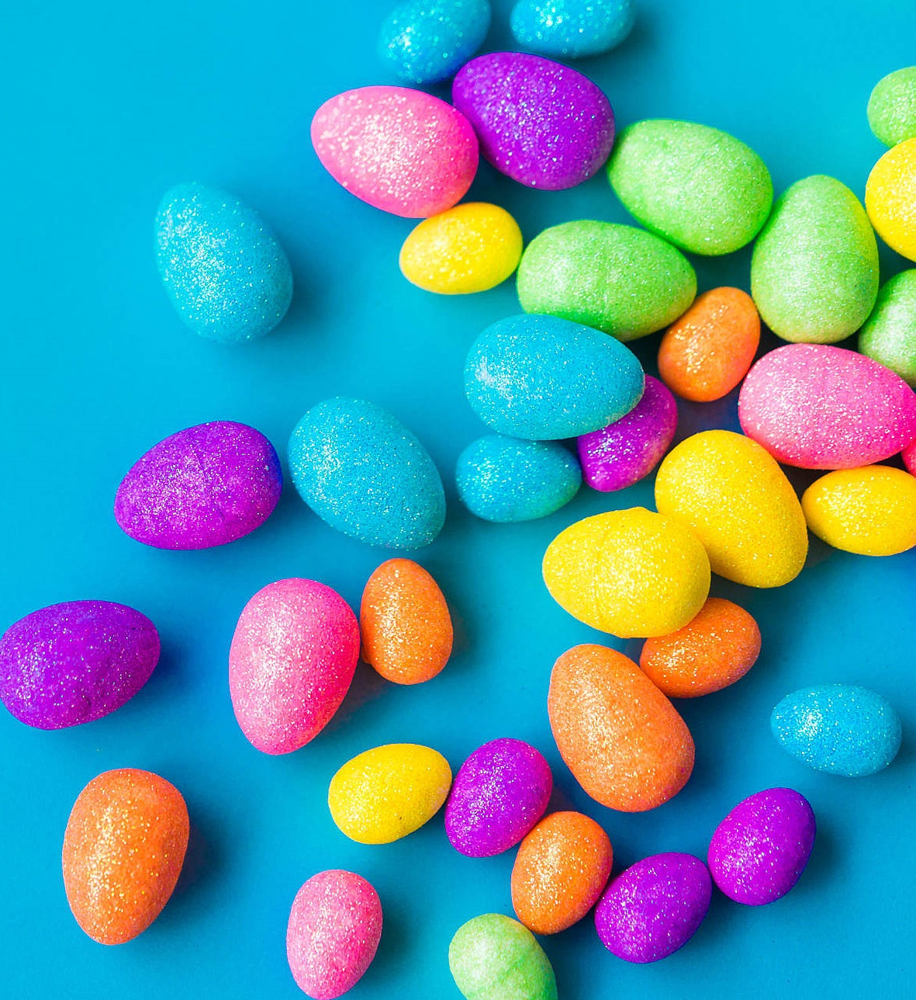

Histogram - Original Image


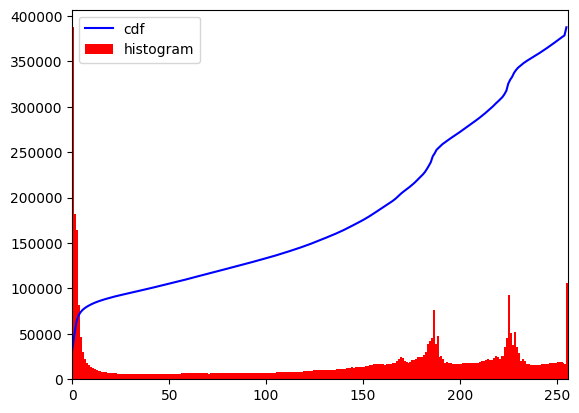

Equalized Image


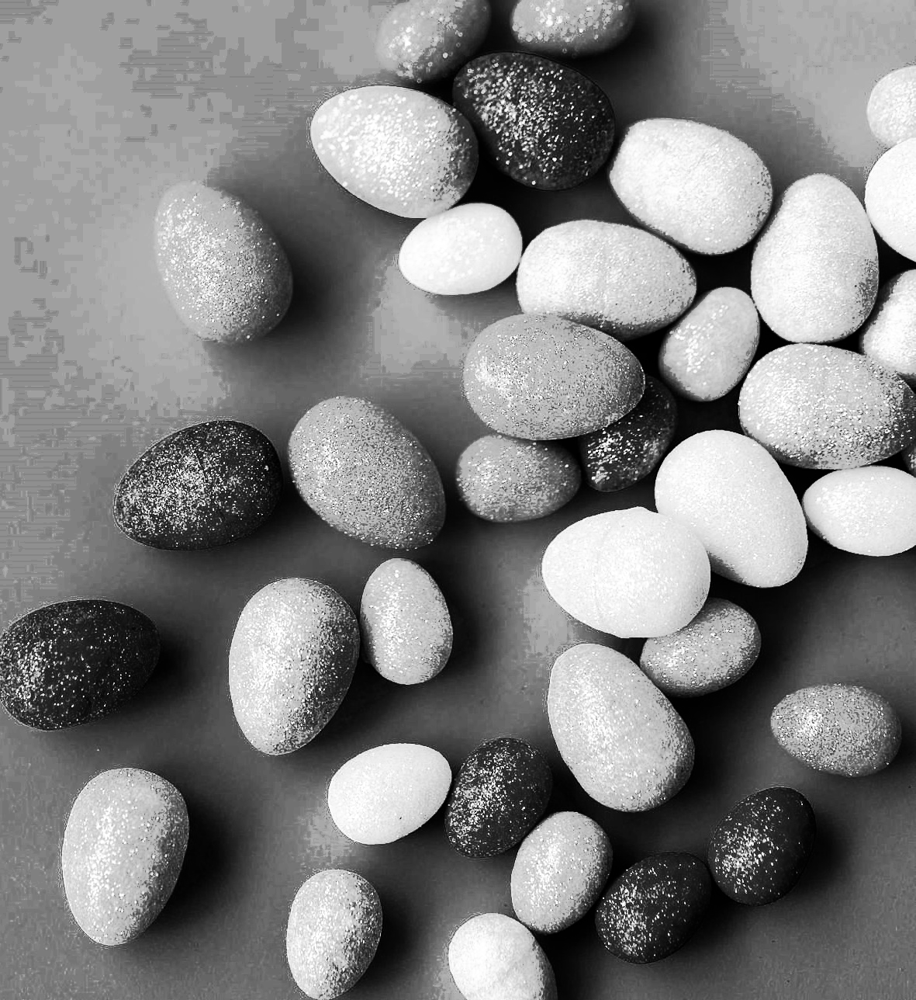

Histogram - Original Image


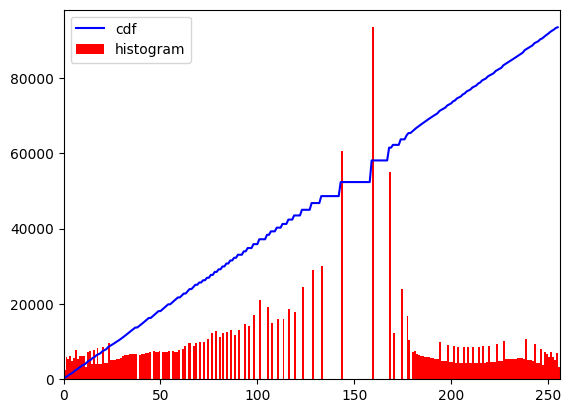

In [27]:
# write your code here
# Third One
img_one = cv2.imread('eggs.jpg')
print("Original Image")
cv2_imshow(img_one)

hist,bins = np.histogram(img_one.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img_one.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
print("Histogram - Original Image")
plt.show()

equ = cv2.equalizeHist(cv2.cvtColor(img_one, cv2.COLOR_BGR2GRAY))
print("Equalized Image")
cv2_imshow(equ)

hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
print("Histogram - Original Image")
plt.show()

## Question 2. Why don't we apply histogram equalization on each color channel separately to implement histogram equalization on color images?

**Answer to Q2**:

Histogram equalisation is a technique for increasing visual contrast by redistributing the intensity levels of pixels. While applying histogram equalisation to every colour channel of a colour image is straightforward, it may not provide satisfactory results. This is due to the fact that colour channels in a colour image are not separate entities, but rather have important inter-channel interactions that must be preserved.

Instead, it should be used to balance intensity levels while maintaining colour harmony in the image. As a result, the first step is to convert the RGB colour space of the image to one that differentiates between intensity values and colour components.


## Task 3. Convert RGB image to Ycbcr from opencv

Use any rgb image and share it from your google drive as shareable link and use it here

Original Image


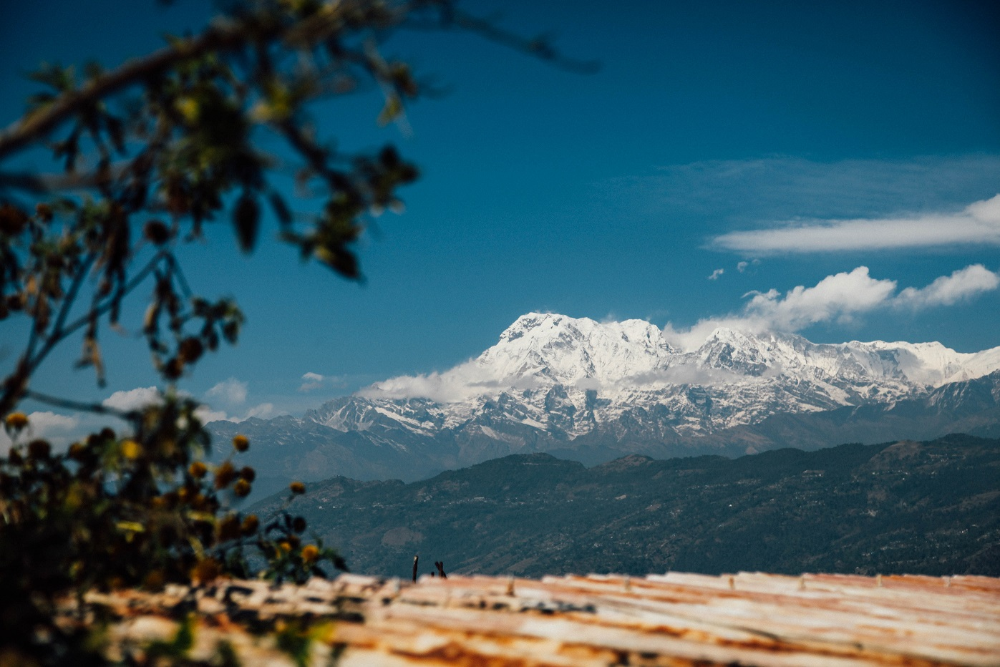

TCrCb Image


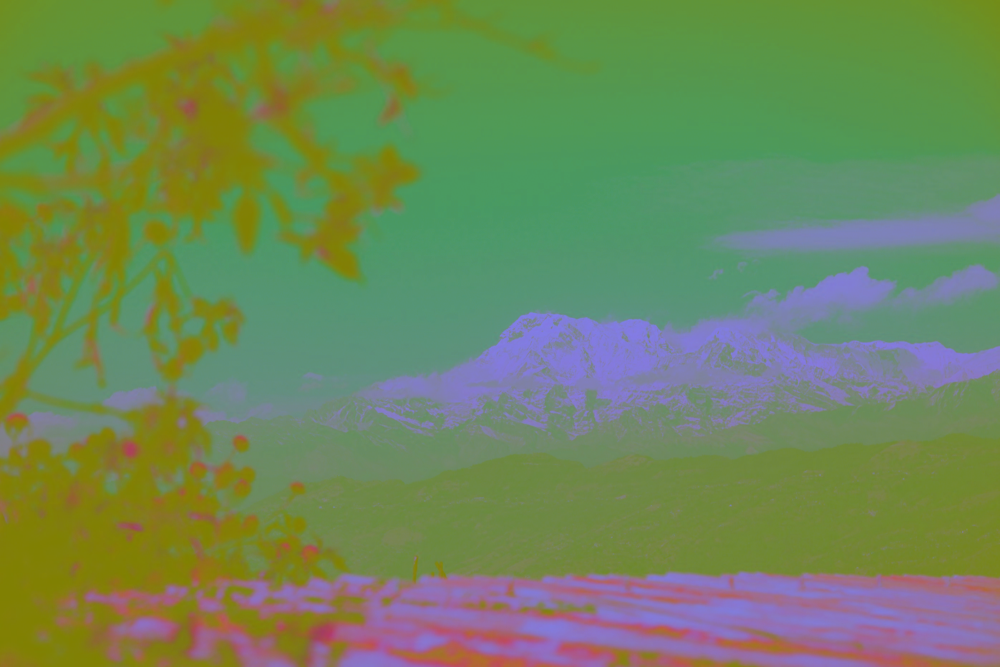

In [28]:
#code here
img = cv2.imread("Nepal.jpg")
ycbcr = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
print("Original Image")
cv2_imshow(img)
print("TCrCb Image")
cv2_imshow(ycbcr)

## Task 4. Design code to implement Features from Accelerated Segment Test (FAST)

Keep your face image file name as **faceimg.jpg**
Save it in drive and use get shareable link to everyone option.

Please print the following during the implementation

* Original Image (faceimg.jpg)

* Gray Image (of original image)

* Number of Keypoints Detected In The Image With Non Max Suppression (Not just number image too)

* Number of Keypoints Detected In The Image Without Non Max Suppression (Not just number image too)


Downloading...
From: https://drive.google.com/uc?id=1TI8vBOSzZ-FryZO2LtMhV1Bw3uVhP5rO
To: /content/faceimg.jpg
100%|██████████| 16.1k/16.1k [00:00<00:00, 28.7MB/s]


Original Image:


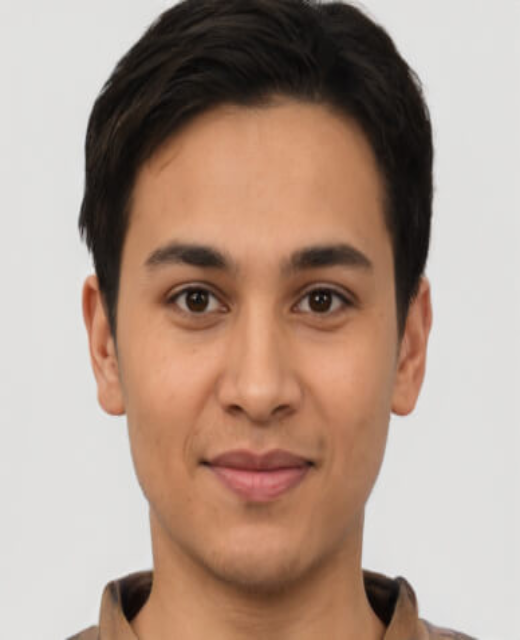

Gray Image:


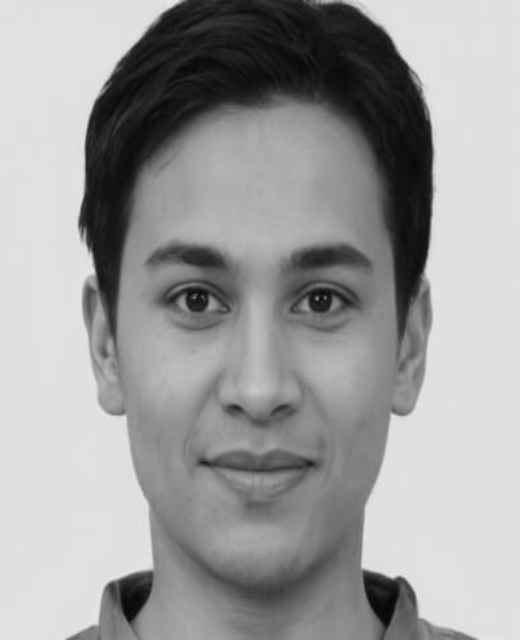

Number of Keypoints Detected In The Image With Non Max Suppression: 200


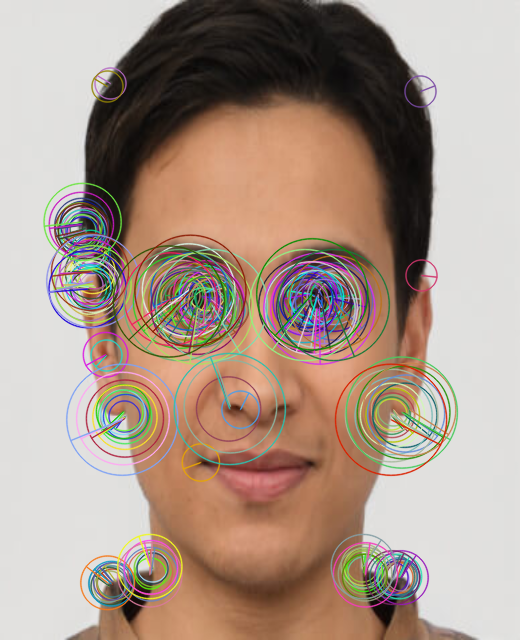

Number of Keypoints Detected In The Image Without Non Max Suppression: 200


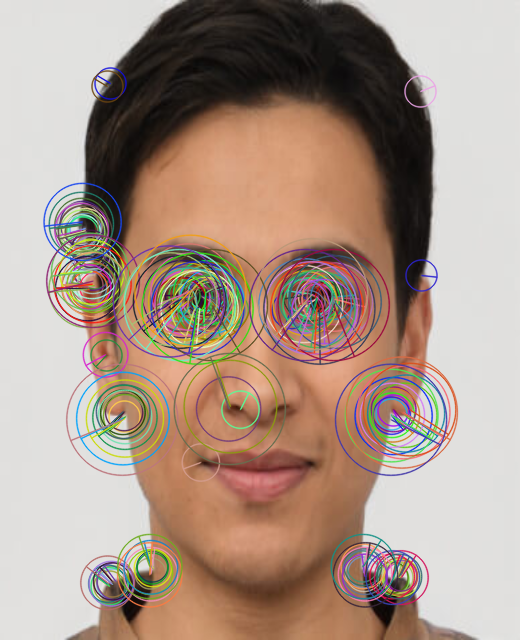

In [3]:
from google.colab.patches import cv2_imshow
import cv2
import gdown

# Google Drive file URL
file_url = "https://drive.google.com/uc?id=1TI8vBOSzZ-FryZO2LtMhV1Bw3uVhP5rO"
# Download the image file from Google Drive
output_path = "faceimg.jpg"
gdown.download(file_url, output_path, quiet=False)


img = cv2.imread(output_path)
img = cv2.resize(img, (520, 640))

# Print original image
print("Original Image:")
cv2_imshow(img)

# Convert image to gray
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Print gray image
print("Gray Image:")
cv2_imshow(gray_img)

# Detect keypoints with non-maximum suppression
orb = cv2.ORB_create(200)
keypoints_nms, des_nms = orb.detectAndCompute(img, None)

# Print number of keypoints with non-maximum suppression
print("Number of Keypoints Detected In The Image With Non Max Suppression:", len(keypoints_nms))

# Draw keypoints on the image with non-maximum suppression
img_final_nms = cv2.drawKeypoints(img, keypoints_nms, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2_imshow(img_final_nms)

# Detect keypoints without non-maximum suppression
orb = cv2.ORB_create(200)
keypoints, des = orb.detectAndCompute(img, None)

# Print number of keypoints without non-maximum suppression
print("Number of Keypoints Detected In The Image Without Non Max Suppression:", len(keypoints))

# Draw keypoints on the image without non-maximum suppression
img_final = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2_imshow(img_final)


## Question 3. Difference between MPEG 4 and MPEG 7

**Answer to Q3**:

MPEG-4 is primarily concerned with the coding and compression of audio and video. Its purpose is to develop efficient encoding and decoding methods for multimedia content so that high-quality audiovisual representation and transmission can be achieved.

MPEG-7 is a framework for representing a variety of multimedia content components, including visual, audio, and textual features. It facilitates effective content search, retrieval, and management by providing uniform descriptions and descriptors for multimedia contents.

MPEG-4 is used in a wide range of applications, including digital television, video streaming services, video conferencing, mobile multimedia, and interactive multimedia systems.

MPEG-7 is widely used in multimedia indexing and content management software. It makes activities like information retrieval, content filtering, multimedia databases, and customised multimedia display easier.

## Question 4.

Whats MPEG 21 ?

Whats the Purpose of MPEG 21 ?

Applications of MPEG 21?

**Answer to Q4**:

MPEG 21: MPEG-21, often known as the MPEG-21 Multimedia Framework, is a multimedia content management and delivery standard created by the Moving Picture Experts Group (MPEG). It is meant to provide a full structure for the integration, interaction, and security of different multimedia components and services.

Purpose: The purpose of MPEG-21 is to produce a set of standards and technologies that will make it easier to create, deliver, and consume multimedia data in a wide range of applications.

The goal is to make information accessible to the greatest number of people possible independent of device, platform, or media player.


Its primary goal is to make all kinds of media useful on all types of devices and networks.

Applications:

1. Content Filtering
2. Asset Manangement
3. Content Filtering
4. Broadcast of Music/Videos

